# Visualisation of scATAC-seq datasets

## Libraries and configuration

In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy as sp
import scIB
import scipy.sparse as sparse
import os.path
import warnings
import logging
from threading import *
from time import *
from queue import *

In [2]:
sc.logging.print_versions()

scanpy==1.4.5.dev114+gd69832a anndata==0.7.1 umap==0.3.10 numpy==1.16.4 scipy==1.3.0 pandas==0.25.1 scikit-learn==0.21.3 statsmodels==0.10.1 python-igraph==0.7.1 louvain==0.6.1


In [3]:
warnings.filterwarnings("ignore")
format_log = "%(asctime)s: %(message)s"
logging.basicConfig(format=format_log, level=logging.INFO,datefmt="%H:%M:%S")
plt.rcParams['figure.figsize'] = (12,12)

# User-defined variables

In [4]:
BATCHNAME = 'batchname'
CELLTYPE = 'final_cell_label'
ATAC_SMALL = "../../../scib_result_atac_small_neu01_03/mouse_brain_atac_small_3datasets/integration/unscaled/full_feature/"
ATAC_LARGE = "../../../scib_result_atac_big_neu01_03/mouse_brain_atac_large_3datasets/integration/unscaled/full_feature/"
ATAC_SMALL_R = ATAC_SMALL + "R/"
ATAC_LARGE_R = ATAC_LARGE + "R/"

mainfig_small_method = ['unintegrated','harmony','combat','conos','scvi']
mainfig_small_title = ['Unintegrated','Harmony','ComBat','Conos','scVI']
mainfig_small_methodtype = ['window','embed','window','knn','embed']
mainfig_small_path = [ATAC_SMALL,ATAC_SMALL_R,ATAC_SMALL,ATAC_SMALL_R,ATAC_SMALL]

mainfig_large_method = ['unintegrated','bbknn','harmony','scanorama','scvi']
mainfig_large_title = ['Unintegrated','BBKNN','Harmony','Scanorama','scVI']
mainfig_large_methodtype = ['window','knn','embed','window','embed']
mainfig_large_path = [ATAC_LARGE,ATAC_LARGE,ATAC_LARGE_R,ATAC_LARGE,ATAC_LARGE]


list_small_method = ['unintegrated','harmony','combat','bbknn','liger','seurat','trvae','scanorama','scanorama','conos','scvi']
list_small_title = ['Unintegrated','Harmony','ComBat','BBKNN','LIGER','Seurat v3','TrVAE','Scanorama','Scanorama','Conos','scVI']
list_small_methodtype = ['window','embed','window','knn','embed','window','embed','embed','window','knn','embed']
list_small_path = [ATAC_SMALL,ATAC_SMALL_R,ATAC_SMALL,ATAC_SMALL,ATAC_SMALL_R,ATAC_SMALL_R,ATAC_SMALL,ATAC_SMALL,ATAC_SMALL,ATAC_SMALL_R,ATAC_SMALL]

list_large_method = ['unintegrated','bbknn','harmony','seurat','combat','scanorama','conos','scanorama','scvi']
list_large_title = ['Unintegrated','BBKNN','Harmony','Seurat v3','Combat','Scanorama','Conos','Scanorama','scVI']
list_large_methodtype = ['window','knn','embed','window','window','embed','knn','window','embed']
list_large_path = [ATAC_LARGE,ATAC_LARGE,ATAC_LARGE_R,ATAC_LARGE_R,ATAC_LARGE,ATAC_LARGE,ATAC_LARGE_R,ATAC_LARGE,ATAC_LARGE]

mainfig_small_input = []
mainfig_small_plottitle = []
for i in range(0,len(mainfig_small_method)):
    INPUTNAME = mainfig_small_path[i] + mainfig_small_method[i] + "_" + mainfig_small_methodtype[i] +"_visualization.h5ad"
    mainfig_small_input.append(INPUTNAME)
    title = mainfig_small_title[i] + " (" + mainfig_small_methodtype[i] + ")"
    mainfig_small_plottitle.append(title)

mainfig_large_input = []
mainfig_large_plottitle = []
for i in range(0,len(mainfig_large_method)):
    INPUTNAME = mainfig_large_path[i] + mainfig_large_method[i] + "_" + mainfig_large_methodtype[i] +"_visualization.h5ad"
    mainfig_large_input.append(INPUTNAME)
    title = mainfig_large_title[i] + " (" + mainfig_large_methodtype[i] + ")"
    mainfig_large_plottitle.append(title)

list_small_input = []
list_small_plottitle = []
for i in range(0,len(list_small_method)):
    INPUTNAME = list_small_path[i] + list_small_method[i] + "_" + list_small_methodtype[i] +"_visualization.h5ad"
    list_small_input.append(INPUTNAME)
    title = list_small_title[i] + " (" + list_small_methodtype[i] + ")"
    list_small_plottitle.append(title)

list_large_input = []
list_large_plottitle = []
for i in range(0,len(list_large_method)):
    INPUTNAME = list_large_path[i] + list_large_method[i] + "_" + list_large_methodtype[i] +"_visualization.h5ad"
    list_large_input.append(INPUTNAME)
    title = list_large_title[i] + " (" + list_large_methodtype[i] + ")"
    list_large_plottitle.append(title)

# Preprocessing


In [5]:
def preprocess_plot(index = 0,input_path = "", method = "", method_type = "", recompute = False):
    INPUTNAME = input_path + method + ".h5ad"
    OUTPUTFILE = input_path + method + "_" + method_type + "_visualization.h5ad"
    if os.path.exists(INPUTNAME):
        if os.path.getsize(INPUTNAME) == 0:
            print("\nJob " + str(index) + " Skipped ... the input file has zero byte: " + INPUTNAME)
            return None
        
        if os.path.exists(OUTPUTFILE) and recompute == False:
            print("\nJob " + str(index) + " Skipped ... the output file exists: " + OUTPUTFILE)
            return None
        
        print("\nJob " + str(index) + " Reading file: " + INPUTNAME)
        adata = sc.read(INPUTNAME)
    else:
        print ("\nJob " + str(index) + " Input file does not exist:" + INPUTNAME)
        return None
    if method_type == 'knn':
        print("\nJob " + str(index) + ' Method: ' + method + ', Type: ' + method_type)
        print("\nJob " + str(index) + ' Calculating FA')
        sc.tl.draw_graph(adata)
        dist_mat = sparse.find(adata.uns['neighbors']['distances'])
        #get number of nearest neighbours parameter
        if 'params' not in adata.uns['neighbors']:
            #estimate the number of nearest neighbors as the minimum of the distance matrix
            _, e = np.unique(dist_mat[0], return_counts=True)
            n_nn = np.nanmin(e)
            n_nn = n_nn.astype('int')
            adata.uns['neighbors']['params'] = dict(n_pcs=adata.obsm['X_pca'].shape[1],
                                                    use_rep='X_pca',
                                                    metric='cosine',
                                                    method='umap',
                                                    n_neighbors=n_nn)
        print("\nJob " + str(index) + ' Calculating UMAP')
        sc.tl.umap(adata)
        print("\nJob " + str(index) + ' Writing file: ' + OUTPUTFILE)
        adata.write(OUTPUTFILE)
    if method_type == 'embed':
        print("\nJob " + str(index) + ' Method: ' + method + ', Type: ' + method_type)
        print("\nJob " + str(index) + ' Calculating neighbors')
        sc.pp.neighbors(adata,use_rep='X_emb')
        print("\nJob " + str(index) + ' Calculating FA')
        sc.tl.draw_graph(adata)
        print("\nJob " + str(index) + ' Calculating UMAP')
        sc.tl.umap(adata)
        print("\nJob " + str(index) + ' Writing file: ' + OUTPUTFILE)
        adata.write(OUTPUTFILE)
    if method_type == 'window':
        print("\nJob " + str(index) + ' Method: ' + method + ', Type: ' + method_type)
        print("\nJob " + str(index) + ' Calculating PCA')
        sc.pp.pca(adata, n_comps=50)
        print("\nJob " + str(index) + ' Calculating neighbors')
        sc.pp.neighbors(adata)
        print("\nJob " + str(index) + ' Calculating FA')
        sc.tl.draw_graph(adata)
        print("\nJob " + str(index) + ' Calculating UMAP')
        sc.tl.umap(adata)
        adata.write(OUTFILE)

In [6]:
q = Queue()
num_worker_threads = 4

def worker():
    while True:
        item = q.get()
        func = item[0]
        args = item[1:]
        func(*args)
        q.task_done()
        
for i in range(num_worker_threads):
     t = Thread(target=worker)
     t.daemon = True
     t.start()

i = 0
for i in range(0,len(list_small_method)):
    q.put( (preprocess_plot,
            i + 1,
            list_small_path[i],
            list_small_method[i],
            list_small_methodtype[i])) 

for j in range(0,len(list_large_method)):
    q.put( (preprocess_plot,
            j + i + 2,
            list_large_path[j],
            list_large_method[j],
            list_large_methodtype[j]))

q.join()



Job 3 Skipped ... the output file exists: ../../../scib_result_atac_small_neu01_03/mouse_brain_atac_small_3datasets/integration/unscaled/full_feature/combat_window_visualization.h5ad

Job 4 Skipped ... the output file exists: ../../../scib_result_atac_small_neu01_03/mouse_brain_atac_small_3datasets/integration/unscaled/full_feature/bbknn_knn_visualization.h5ad

Job 5 Skipped ... the output file exists: ../../../scib_result_atac_small_neu01_03/mouse_brain_atac_small_3datasets/integration/unscaled/full_feature/R/liger_embed_visualization.h5ad

Job 1 Skipped ... the output file exists: ../../../scib_result_atac_small_neu01_03/mouse_brain_atac_small_3datasets/integration/unscaled/full_feature/unintegrated_window_visualization.h5ad

Job 2 Skipped ... the output file exists: ../../../scib_result_atac_small_neu01_03/mouse_brain_atac_small_3datasets/integration/unscaled/full_feature/R/harmony_embed_visualization.h5ad

Job 6 Skipped ... the output file exists: ../../../scib_result_atac_small_n

# Main figures in the manuscript

In [7]:
def multiple_plot(methods = None,titles = None, inputs = None, output_subfix = "plot", no_row = 3, no_column = 4, colorby = None, set_palette = None):
    OUTPLOT = output_subfix + "_unintegrated.png"
    adata = sc.read(inputs[0])
    for j in range(0,len(colorby)):
        sc.pl.umap(adata, save = OUTPLOT, color=colorby[j], size=20, title=titles[0], show=True, frameon=False, palette=set_palette[j])

    fig, axs = plt.subplots(no_row, no_column, figsize=(10 * no_column,8 * no_row))
    OUTPLOT1 = output_subfix + ".png"
    count = 0
    for i in range(0,len(methods)):
        sp = None
        if os.path.exists(inputs[i]):
            #print('Reading file: ' + inputs[i])
            adata = sc.read(inputs[i])
            if methods[i] != 'conos':
                for j in range(0,len(colorby)):
                    if len(axs.shape) > 1:
                        sp = axs[count//no_column,count%no_column]
                    else:
                        sp = axs[count]
                    if j == 0:
                        texttitle = titles[i] + " - batches"
                    else:
                        texttitle = titles[i] + " - cell types"
                    sc.pl.umap(adata, color=colorby[j], size=20, title=texttitle, legend_loc="", ax=sp, show=False, frameon=False, palette=set_palette[j])
                    count = count + 1
            else:
                for j in range(0,len(colorby)):
                    if len(axs.shape) > 1:
                        sp = axs[count//no_column,count%no_column]
                    else:
                        sp = axs[count]
                    if j == 0:
                        texttitle = titles[i] + " - batches"
                    else:
                        texttitle = titles[i] + " - cell types"
                    sc.pl.draw_graph(adata, color=colorby[j], size=20, title=texttitle, legend_loc="", ax=sp, show=False, frameon=False, palette=set_palette[j])
                    count = count + 1
        else:
            print('File not found: ' + inputs[i])
        
    if len(axs.shape) > 1:
        while (count < (no_column * no_row)):
            axs[count//no_column,count%no_column].plot(show=False)
            axs[count//no_column,count%no_column].axis('off')
            count = count + 1
            
    fig.savefig(OUTPLOT1)


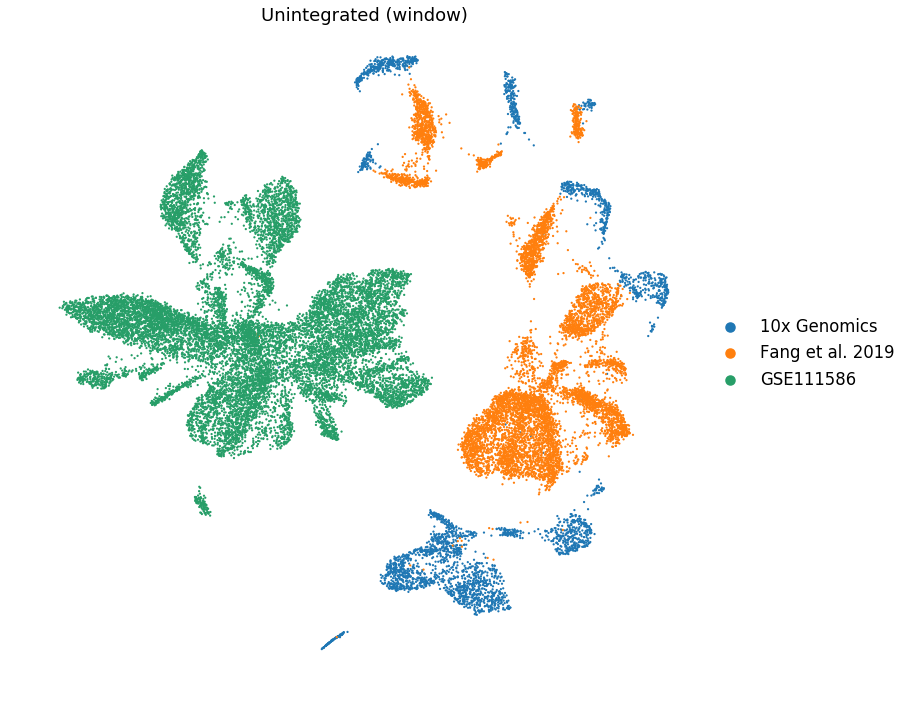

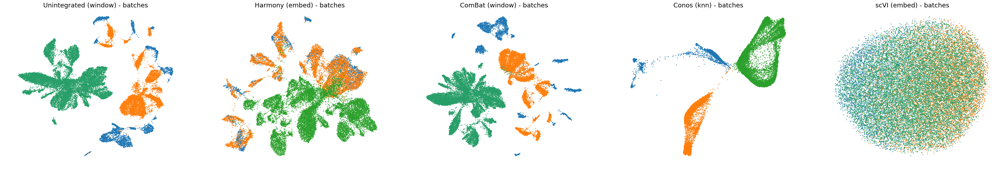

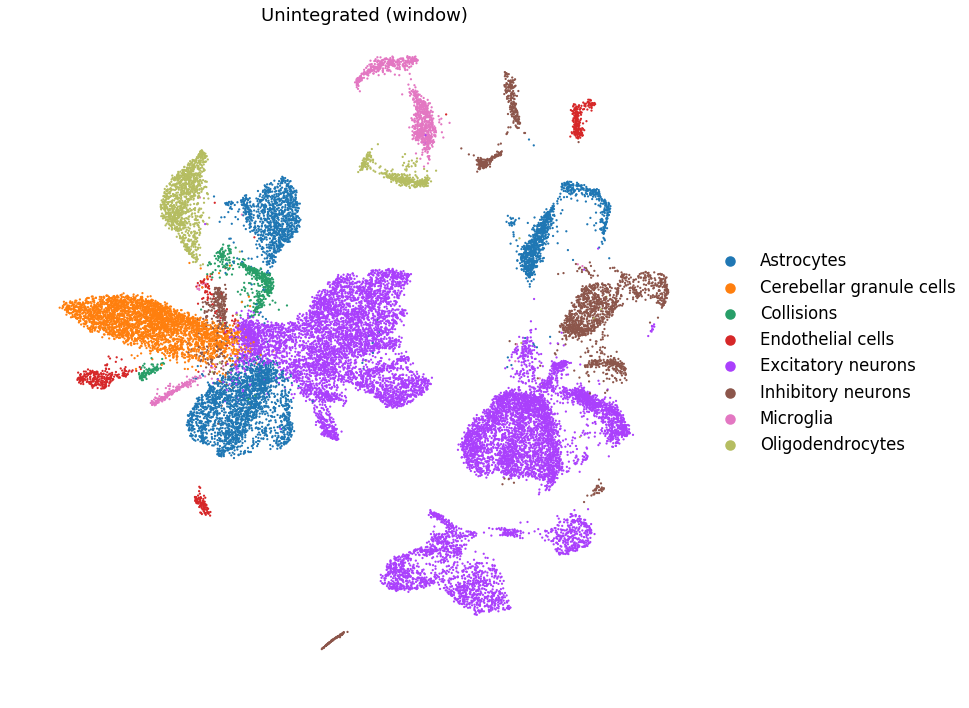

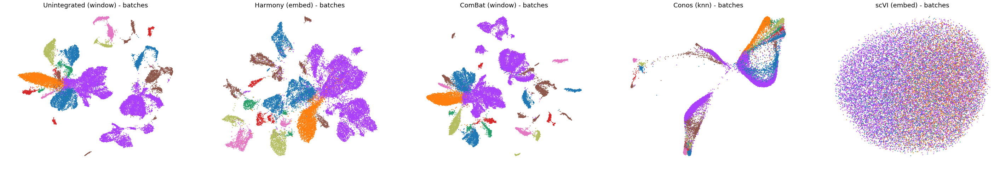

In [8]:
multiple_plot(methods = mainfig_small_method, titles = mainfig_small_plottitle, inputs = mainfig_small_input, 
              output_subfix = "_mainfig_small_atac_batch", no_row = 1, no_column = 5, colorby = [BATCHNAME] , set_palette = [None])
multiple_plot(methods = mainfig_small_method, titles = mainfig_small_plottitle, inputs = mainfig_small_input, 
              output_subfix = "_mainfig_small_atac_celltype", no_row = 1, no_column = 5, colorby = [CELLTYPE], set_palette = [sc.pl.palettes.default_20])

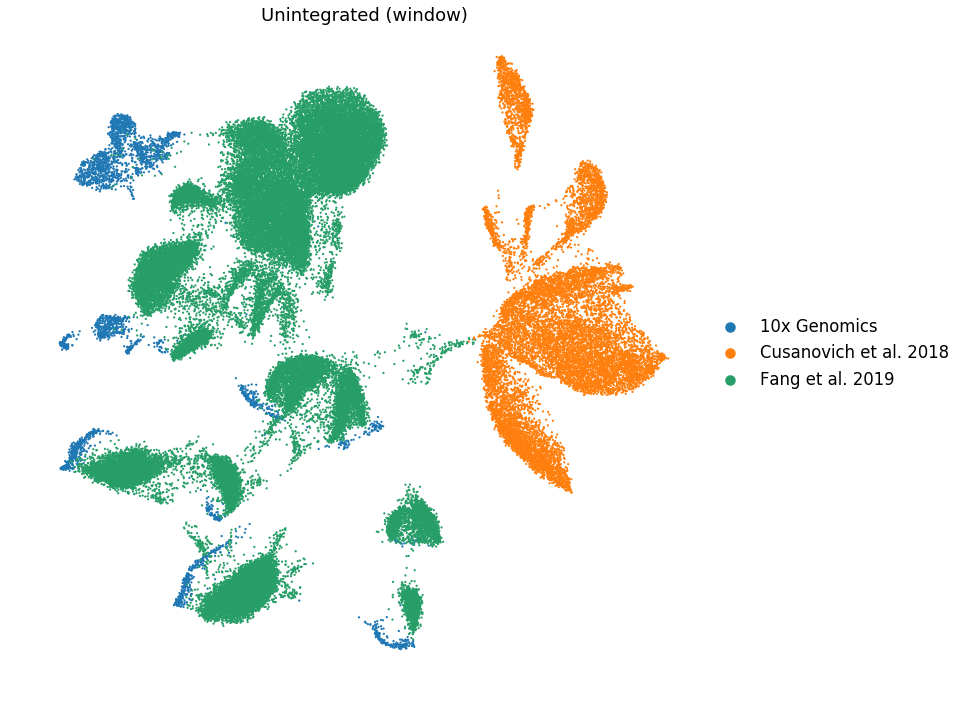

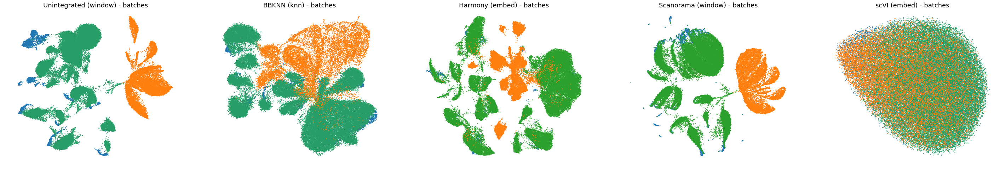

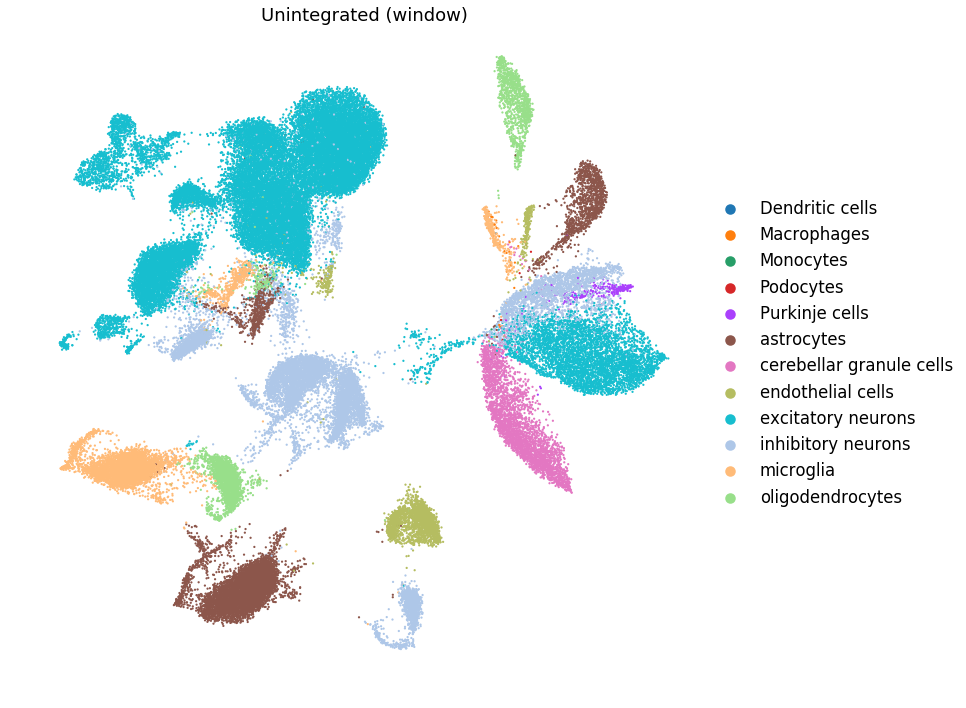

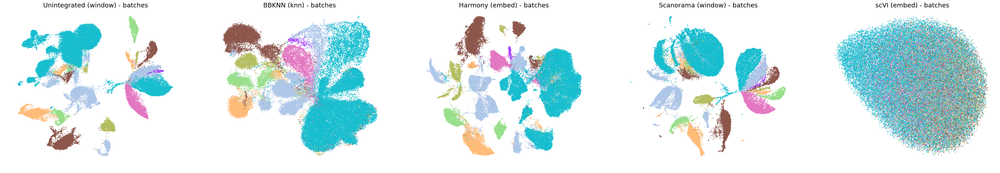

In [9]:
multiple_plot(methods = mainfig_large_method, titles = mainfig_large_plottitle, inputs = mainfig_large_input, 
              output_subfix = "_mainfig_large_atac_batch", no_row = 1, no_column = 5, colorby = [BATCHNAME] , set_palette = [None])
multiple_plot(methods = mainfig_large_method, titles = mainfig_large_plottitle, inputs = mainfig_large_input, 
              output_subfix = "_mainfig_large_atac_celltype", no_row = 1, no_column = 5, colorby = [CELLTYPE], set_palette = [sc.pl.palettes.default_20])

# All visualisation for Small ATAC dataset

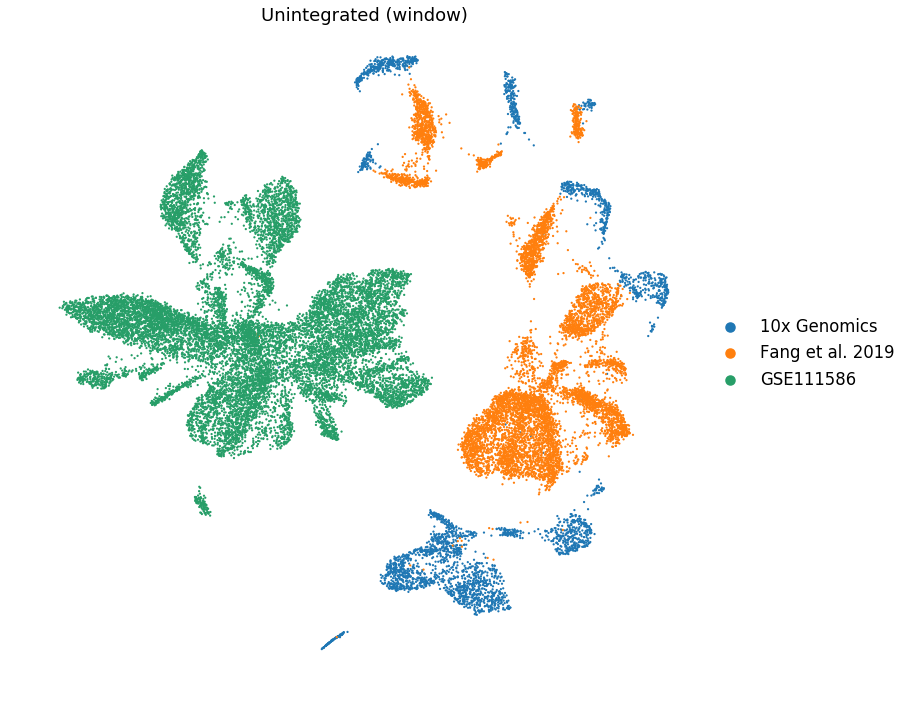

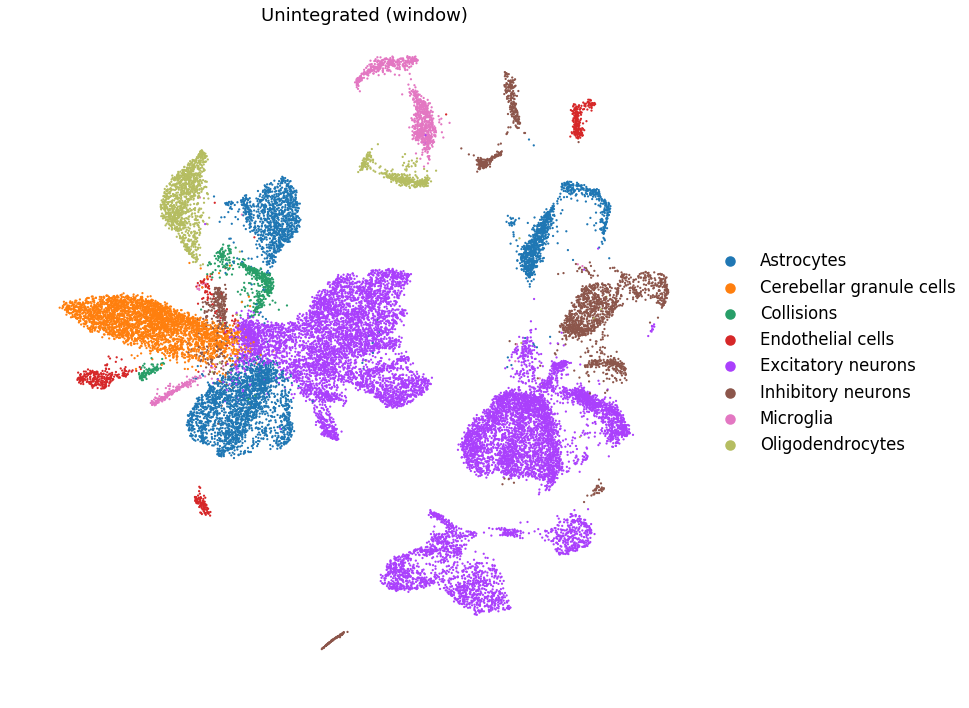

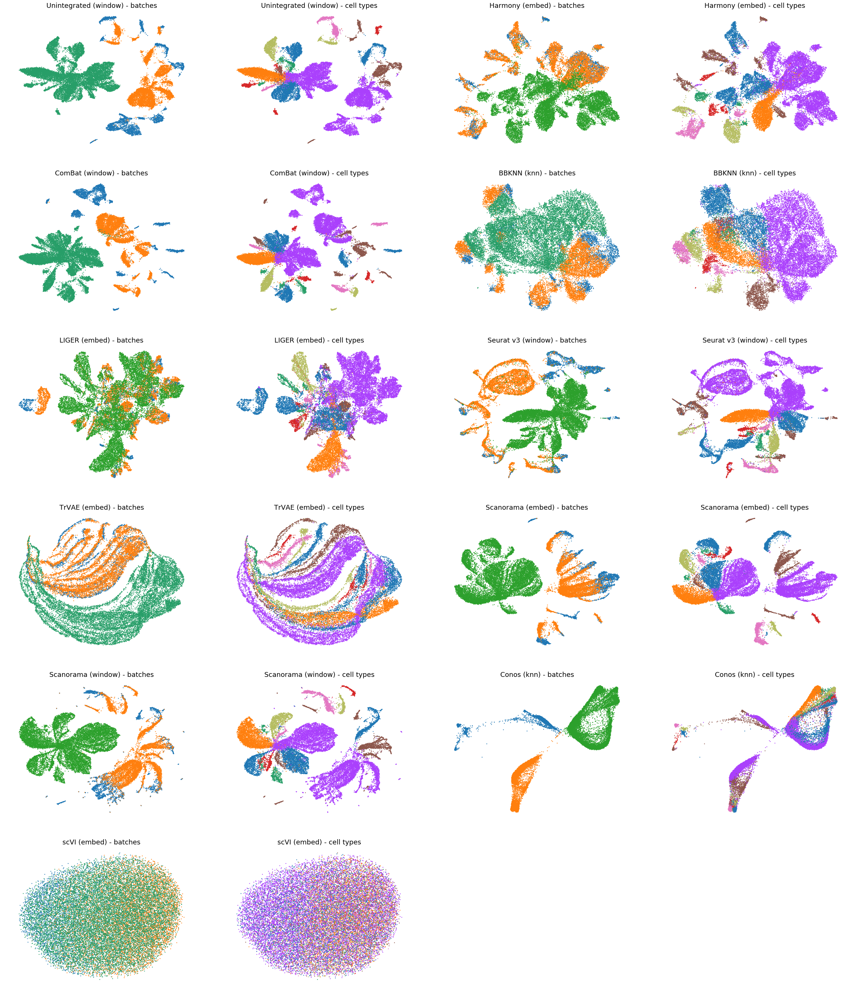

In [10]:
multiple_plot(methods = list_small_method, titles = list_small_plottitle, inputs = list_small_input, 
              output_subfix = "_small_atac_batch", no_row = 6, no_column = 4, colorby = [BATCHNAME,CELLTYPE] , set_palette = [None,sc.pl.palettes.default_20])

# All visualisation for Large ATAC dataset

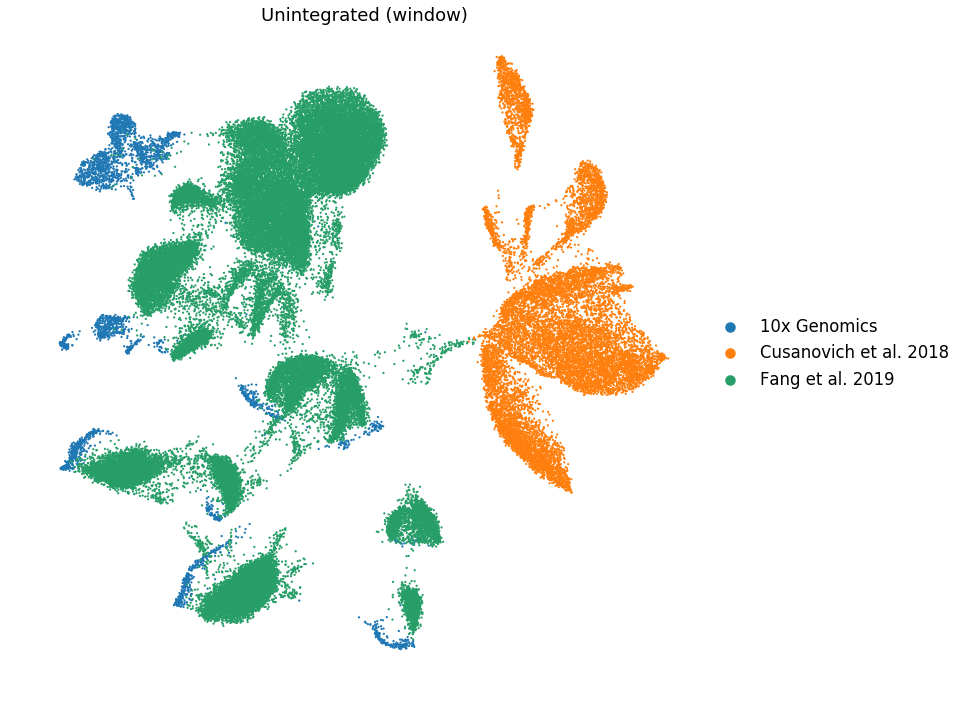

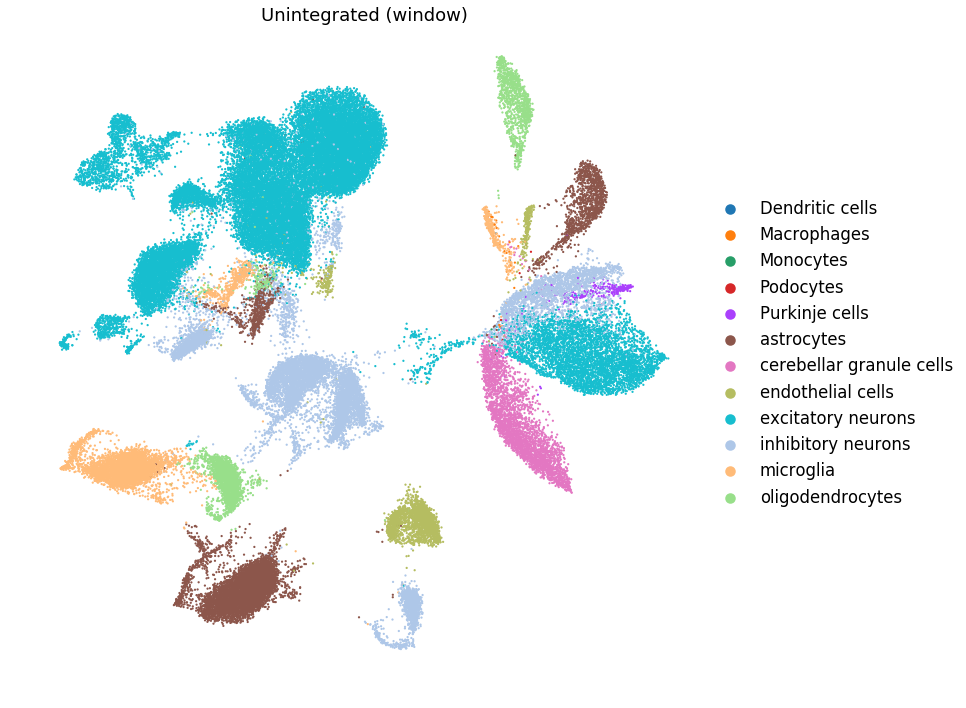

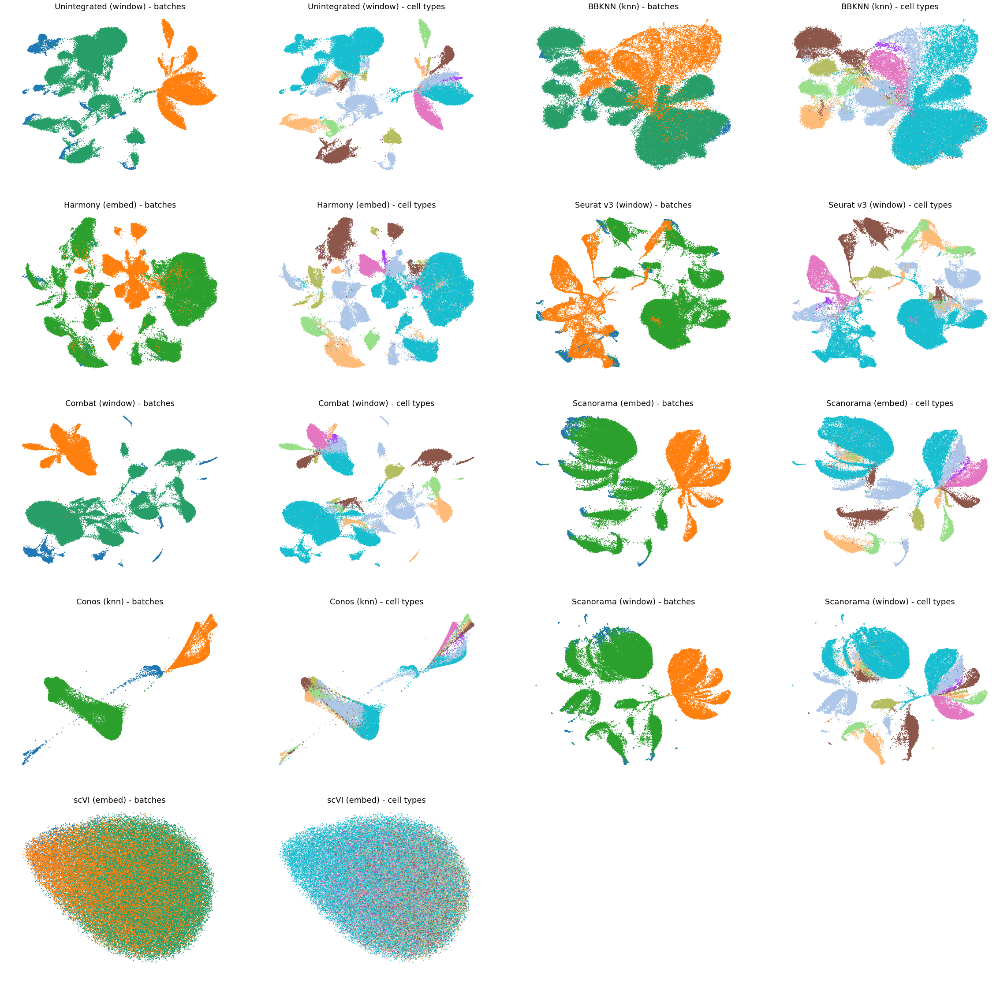

In [11]:
multiple_plot(methods = list_large_method, titles = list_large_plottitle, inputs = list_large_input, 
              output_subfix = "_large_atac_batch", no_row = 5, no_column = 4, colorby = [BATCHNAME,CELLTYPE] , set_palette = [None,sc.pl.palettes.default_20])